## Proyecto: Población Mundial
#### Métodos Numéricos II
---

#### Lectura de datos

Leemos el dataset provisto y seleccionamos las columnas de datos identificadas como relevantes. 

In [1]:
import pandas as pd

datosPoblacionales = pd.read_csv('countries-table.csv')
datosPoblacionales = datosPoblacionales[['country','pop1980','pop2000','pop2010','pop2023','pop2024','pop2030','pop2050','landAreaKm','netChange','growthRate','worldPercentage','density']]
display(datosPoblacionales)

,country,pop1980,pop2000,pop2010,pop2023,pop2024,pop2030,pop2050,landAreaKm,netChange,growthRate,worldPercentage,density
0,India,687354000,1057920000,1243480000,1438070000,1450940000,1525140000,1679590000,2973190.00,0.4119,0.0089,0.1813,488.0078
1,China,983164000,1269580000,1351560000,1422580000,1419320000,1398150000,1260290000,9424702.90,-0.1006,-0.0023,0.1773,150.5957
2,United States,229859000,281484000,311063000,343477000,345427000,355650000,380847000,9147420.00,0.0600,0.0057,0.0432,37.7622
3,Indonesia,148951000,216078000,246305000,281190000,283488000,295877000,320713000,1877519.00,0.0719,0.0082,0.0354,150.9907
4,Pakistan,82291000,154879000,199239000,247504000,251269000,276883000,371864000,770880.00,0.1225,0.0152,0.0314,325.9509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
229,Montserrat,11339,5029,4794,4420,4389,4202,3692,102.00,NaN,-0.0070,NaN,43.0294
230,Falkland Islands,2252,3097,3197,3477,3470,3422,3176,12173.00,NaN,-0.0020,NaN,0.2851
231,Tokelau,1664,1845,1585,2397,2506,2985,3821,10.00,0.0000,0.0455,NaN,250.6000
232,Niue,3533,2047,1768,1817,1819,1835,1966,261.00,NaN,0.0011,NaN,6.9693


#### Gráficas de datos poblacionales de todos los países

Para visualizar los datos, graficaremos por un lado los datos de todos los países y luego los de cada país por separado. Se graficarán los datos poblacionales hasta 2024, sin las proyecciones para 2030 y 2050. 

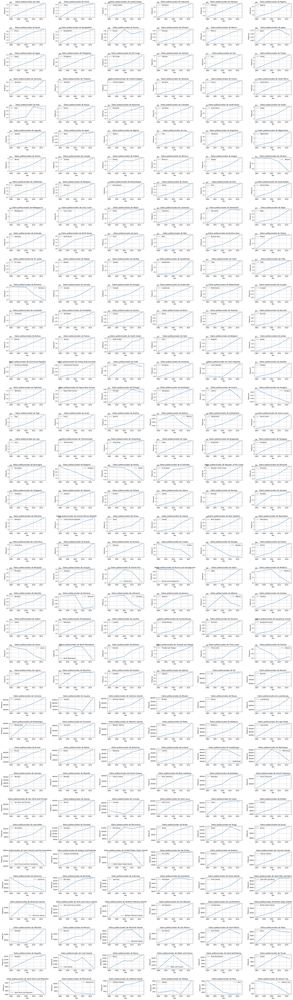

In [2]:
import matplotlib.pyplot as plt
import numpy as np

anios = [1980,2000,2010,2023,2024]
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]
    axs[i,j].plot(anios, datosPais[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label=pais)
    axs[i,j].set_title("Datos poblacionales de "+pais)
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_xlabel('Año')
    axs[i,j].set_ylabel('Población')
    j = j+1
    if j == 6:
        j = 0
        i = i+1


#### Evaluación del ajuste de los datos al modelo usando regresión lineal

El modelo de Malthus es el siguiente: 

$$P(t) = P_0 e^{rt} $$

con $r$ tasa de crecimiento, $P_0$ población y $t$ tiempo en años. Para el análisis, convertiremos el dato de "año" en diferencia en años desde 1980.  



In [3]:
# Renombramos columnas de año a que corresponden datos poblacionales
diferenciasEnAniosDesde1980 = [0,20,30,43,44] 
columnasARenombrar = ['pop1980','pop2000','pop2010','pop2023','pop2024']

renombrarColumnas = dict(zip(columnasARenombrar,diferenciasEnAniosDesde1980))
datosPoblacionales.rename(columns=renombrarColumnas,inplace=True)

display(datosPoblacionales)

,country,0,20,30,43,44,pop2030,pop2050,landAreaKm,netChange,growthRate,worldPercentage,density
0,India,687354000,1057920000,1243480000,1438070000,1450940000,1525140000,1679590000,2973190.00,0.4119,0.0089,0.1813,488.0078
1,China,983164000,1269580000,1351560000,1422580000,1419320000,1398150000,1260290000,9424702.90,-0.1006,-0.0023,0.1773,150.5957
2,United States,229859000,281484000,311063000,343477000,345427000,355650000,380847000,9147420.00,0.0600,0.0057,0.0432,37.7622
3,Indonesia,148951000,216078000,246305000,281190000,283488000,295877000,320713000,1877519.00,0.0719,0.0082,0.0354,150.9907
4,Pakistan,82291000,154879000,199239000,247504000,251269000,276883000,371864000,770880.00,0.1225,0.0152,0.0314,325.9509
...,...,...,...,...,...,...,...,...,...,...,...,...,...
229,Montserrat,11339,5029,4794,4420,4389,4202,3692,102.00,NaN,-0.0070,NaN,43.0294
230,Falkland Islands,2252,3097,3197,3477,3470,3422,3176,12173.00,NaN,-0.0020,NaN,0.2851
231,Tokelau,1664,1845,1585,2397,2506,2985,3821,10.00,0.0000,0.0455,NaN,250.6000
232,Niue,3533,2047,1768,1817,1819,1835,1966,261.00,NaN,0.0011,NaN,6.9693


Para evaluar si los datos se ajustan al modelo de Malthus, podemos graficarlos en escala logarítmica y evaluar si las gráficas de cada uno se ajustan a una recta. Tengamos en cuenta que el modelo de Malthus se puede linealizar de la siguiente forma, resultando como parámetros de la recta de regresión los que se indican a continuación:

$$P(t) = P_0 e^{rt} $$
$$ln(P) = ln(P_0 e^{rt}) $$
$$ln(P) = ln(P_0)+ln(e^{rt}) $$
$$ln(P) = ln(P_0)+rt $$

con parámetros $\begin{cases} b = ln(P_0) \\ m = r \end{cases}$ para la recta $y = mt + b$ con $y=ln(P)$.




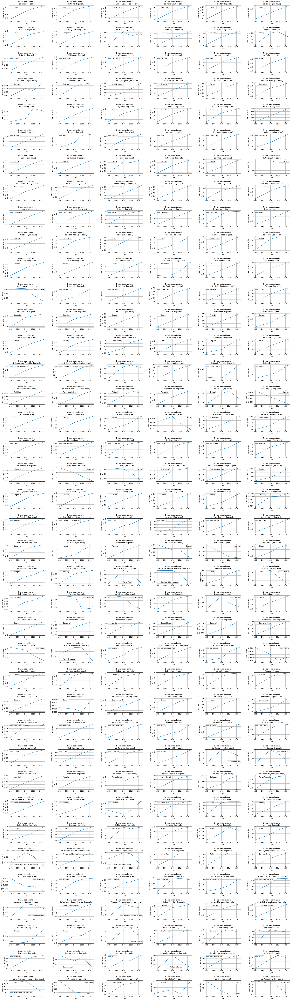

In [4]:
# Grafico en escala logarítmica
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]
    axs[i,j].plot(anios, np.log(datosPais[diferenciasEnAniosDesde1980].values.flatten()), label=pais)
    axs[i,j].set_title("Datos poblacionales \nde "+pais+" (log scale)")
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('log(población)')
    axs[i,j].set_xlabel('Año')
    j = j+1
    if j == 6:
        j = 0
        i = i+1

Podemos observar que para los datos de la mayoría de los países es posible ajustar un recta (aunque no para todos y evaluaremos el ajuste para esos países a fines de evaluar qué tanto responden al modelo de Malthus). Para los datos de cada país, ajustamos rectas usando la librería sklearn.linear_model, clase LinearRegression. Al realizar la regresión lineal, obtendremos estimaciones de los parámetros $b$ y $m$ indicados anteriormente. 

In [5]:

from sklearn.linear_model import LinearRegression

datosOriginales = pd.read_csv('countries-table.csv') # leemos los datos de nuevo ya que los que tenemos no contienen las columnas con años sino diferencias

# Datos transformados
datosLog = datosOriginales[['country','pop1980','pop2000','pop2010','pop2023','pop2024','pop2030','pop2050']]
datosLog[['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024', 'pop2030','pop2050']] = np.log(datosLog[['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024', 'pop2030','pop2050']])

print("Datos transformados (aplicando logaritmo natural):")
display(datosLog)

columnas = ['pais', 'regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050', 'm', 'b', 'r2']
regresionPorPais = pd.DataFrame(columns=columnas)

datosPoblacionales
diferenciasAniosParaEstimaciones = diferenciasEnAniosDesde1980 + [50, 70]
resultados = []  

for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]

    regresion = LinearRegression().fit(np.array(diferenciasEnAniosDesde1980).reshape(-1, 1), 
                                       np.log(datosPais[diferenciasEnAniosDesde1980].values.flatten()))
    predicciones = regresion.predict(np.array(diferenciasAniosParaEstimaciones).reshape(-1, 1))


    resultados.append({'pais': pais,
                       'regpop1980': predicciones[0],
                       'regpop2000': predicciones[1],
                       'regpop2010': predicciones[2],
                       'regpop2023': predicciones[3],
                       'regpop2024': predicciones[4],
                       'est2030': predicciones[5],
                       'est2050': predicciones[6],
                       'm': regresion.coef_[0],
                       'b': regresion.intercept_,
                       'r2': regresion.score(np.array(diferenciasEnAniosDesde1980).reshape(-1, 1), 
                                             np.log(datosPais[diferenciasEnAniosDesde1980].values.flatten()))})


regresionPorPais = pd.DataFrame(resultados)
print("Resultados regresión lineal:")
display(regresionPorPais)


d:\anaconda\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Datos transformados (aplicando logaritmo natural):


d:\anaconda\lib\site-packages\pandas\core\frame.py:3641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


,country,pop1980,pop2000,pop2010,pop2023,pop2024,pop2030,pop2050
0,India,20.348360,20.779571,20.941180,21.086568,21.095477,21.145352,21.241816
1,China,20.706287,20.961952,21.024525,21.075738,21.073444,21.058416,20.954608
2,United States,19.252977,19.455586,19.555506,19.654631,19.660292,19.689458,19.757908
3,Indonesia,18.819128,19.191150,19.322081,19.454541,19.462680,19.505454,19.586057
4,Pakistan,18.225772,18.858155,19.110016,19.326937,19.342035,19.439106,19.734039
...,...,...,...,...,...,...,...,...
229,Montserrat,9.336003,8.522976,8.475120,8.393895,8.386857,8.343316,8.213924
230,Falkland Islands,7.719574,8.038189,8.069968,8.153925,8.151910,8.137980,8.063378
231,Tokelau,7.416980,7.520235,7.368340,7.781973,7.826443,8.001355,8.248267
232,Niue,8.169903,7.624131,7.477604,7.504942,7.506042,7.514800,7.583756


Resultados regresión lineal:


,pais,regpop1980,regpop2000,regpop2010,regpop2023,regpop2024,est2030,est2050,m,b,r2
0,India,20.391879,20.726443,20.893724,21.111191,21.127919,21.228288,21.562852,0.016728,20.391879,0.977365
1,China,20.746222,20.908388,20.989471,21.094878,21.102987,21.151636,21.313802,0.008108,20.746222,0.926608
2,United States,19.262330,19.447343,19.539850,19.660109,19.669360,19.724864,19.909877,0.009251,19.262330,0.995519
3,Indonesia,18.855750,19.143463,19.287319,19.474332,19.488717,19.575031,19.862743,0.014386,18.855750,0.979056
4,Pakistan,18.286605,18.787319,19.037676,19.363140,19.388176,19.538390,20.039104,0.025036,18.286605,0.979583
...,...,...,...,...,...,...,...,...,...,...,...
229,Montserrat,9.172012,8.771252,8.570872,8.310377,8.290339,8.170111,7.769350,-0.020038,9.172012,0.824221
230,Falkland Islands,7.769305,7.957194,8.051139,8.173267,8.182662,8.239028,8.426918,0.009394,7.769305,0.916473
231,Tokelau,7.344023,7.518308,7.605451,7.718737,7.727451,7.779737,7.954022,0.008714,7.344023,0.572953
232,Niue,8.050785,7.763003,7.619113,7.432055,7.417666,7.331331,7.043550,-0.014389,8.050785,0.805335


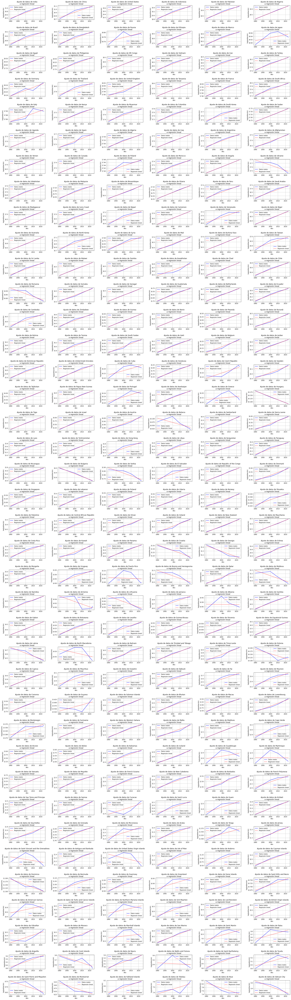

In [6]:
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

for pais in datosPoblacionales['country']:
    
    datosPaisLog = datosLog[datosLog['country'] == pais]
    
    regresion = regresionPorPais[regresionPorPais['pais'] == pais]

    valoresRegresion = regresion[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024']].values.flatten()
    
    axs[i,j].plot(anios, datosPaisLog[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label='Datos reales', color='blue')
    
    axs[i,j].plot(anios, valoresRegresion, label='Regresión lineal', color='red', linestyle='--')
    
    axs[i,j].set_title(f"Ajuste de datos de {pais}\na regresión lineal")
    
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('log(población)')
    axs[i,j].set_xlabel('Año')

    j = j + 1
    if j == 6:
        j = 0
        i = i + 1


Analizamos los valores de $R^2$ para evaluar en qué países los datos poblacionales se ajustan mejor al modelo de Malthus. Los siguientes valores y gráficos nos dan una idea de qué valor de $R^2$ podemos considerar como óptimo para evaluar el ajuste.

In [7]:
ajustePorPais = regresionPorPais[['pais','r2']]

print("Análisis de valores de R2:")
display(ajustePorPais['r2'].describe())


Análisis de valores de R2:


count    234.000000
mean       0.885937
std        0.209917
min        0.000273
25%        0.902311
50%        0.973884
75%        0.992271
max        0.999994
Name: r2, dtype: float64

In [19]:
# Análisis de outliers
q1 = ajustePorPais['r2'].quantile(0.25)
q3 = ajustePorPais['r2'].quantile(0.75)
outliers = ajustePorPais[ajustePorPais['r2'] <= q1 - 1.5*(q3-q1)].append( ajustePorPais[ajustePorPais['r2'] >= q3 + 1.5*(q3-q1)])

print("Cantidad de outliers: ",outliers.shape[0])
print("Porcentaje del total: ",(outliers.shape[0]/ajustePorPais.shape[0])*100)
print("Mayor R2 de los outliers: ",outliers['r2'].max())

Cantidad de outliers:  34
Porcentaje del total:  14.529914529914532
Mayor R2 de los outliers:  0.7509518108246037


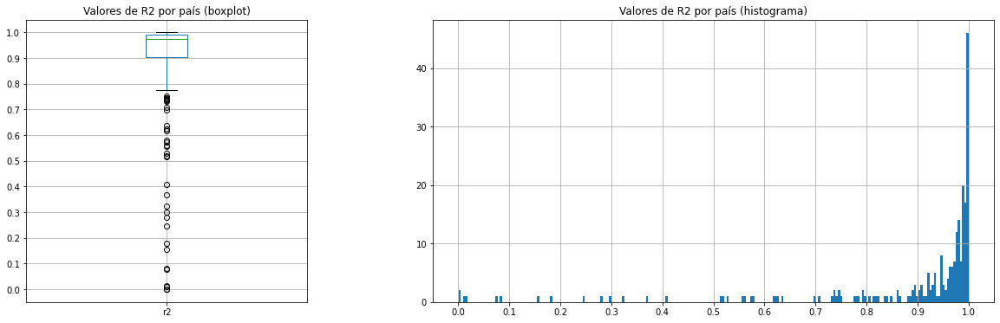

In [9]:
# Gráfico de caja para visualizar los valores de R2
fig, ax = plt.subplots(1,2,figsize=(20,6),gridspec_kw={'width_ratios': [1,2]},facecolor='white')

ajustePorPais.boxplot(column='r2',ax=ax[0])
ajustePorPais.hist(column='r2',ax=ax[1],bins=ajustePorPais.shape[0])

ax[0].set_title('Valores de R2 por país (boxplot)')
ax[0].set_yticks(np.arange(0,1.1,0.1))
ax[1].set_title('Valores de R2 por país (histograma)')
ax[1].set_xticks(np.arange(0,1.1,0.1))


plt.show()

El gráfico de caja es otra forma de visualizar los datos obtenidos arriba (cuartiles, rango intercuartil, outliers). Además, en el histograma también podemos ver la distribución de los valores de $R^2$ (en el eje vertical se indica la frecuencia). A simple vista, los valores de $R^2$ están concentrados hacia 0.95 a 1. Los outliers representan el 14,5% del total, hacia valores menores de $R^2$ (lo que indica que la tendencia es hacia un mejor ajuste al modelo que hacia un peor ajuste). En base a lo anterior, podemos decir que la mayoría de los países se ajustan al modelo de Malthus. 

Para poder cuantificar la cantidad de países que se ajustan al modelo, podríamos considerar como valores aceptables de $R^2 \geq 0.95$ (entre la mediana y el primer cuartil). En base a eso, obtenemos los siguientes valores: 

# Agregar: elección del valor de R2 teniendo en cuenta la cantidad de datos que tenemos

In [21]:
paisesConMuyBuenAjuste = ajustePorPais[ajustePorPais['r2'] >= 0.95]
paisesConBuenAjuste = ajustePorPais.query('r2 < 0.95 & r2 > @q1 - 1.5*(@q3-@q1)')

print("Paises con muy buen ajuste (R2 >= 0.95): ",paisesConMuyBuenAjuste.shape[0])
print("Paises con buen ajuste (R2 < 0.95 y no outliers): ",paisesConBuenAjuste.shape[0])
print("Paises con mal ajuste (outliers): ",outliers.shape[0])



Paises con muy buen ajuste (R2 >= 0.95):  142
Paises con buen ajuste (R2 < 0.95 y no outliers):  58
Paises con mal ajuste (outliers):  34


Ordenamos los países por $R^2$ y graficamos de nuevo para observar cuáles consideramos como con buen ajuste y cuáles con menor ajuste.

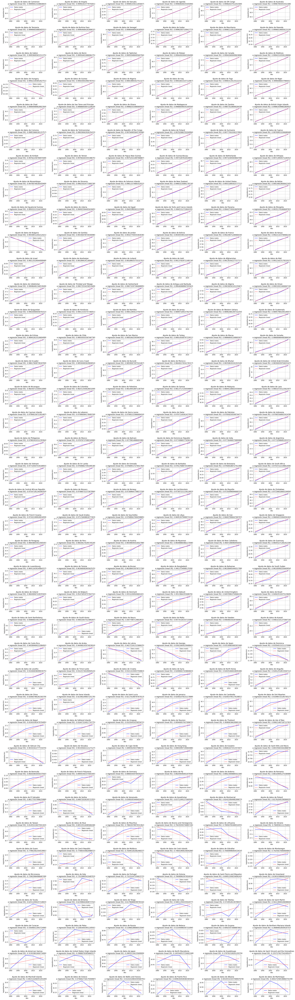

In [ ]:
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=6.0)

i = 0
j = 0

regresionPorPais.sort_values(by='r2',ascending=False,inplace=True)

for pais in regresionPorPais['pais']:
        
    datosPaisLog = datosLog[datosLog['country'] == pais]
    regresion = regresionPorPais[regresionPorPais['pais'] == pais]
    valoresRegresion = regresion[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024']].values.flatten()
    
    axs[i,j].plot(anios, datosPaisLog[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label='Datos reales', color='blue')
    
    axs[i,j].plot(anios, valoresRegresion, label='Regresión lineal', color='red', linestyle='--')
    
    axs[i,j].set_title(f"Ajuste de datos de {pais}\na regresión lineal (R2: {regresion['r2'].values[0]})")
    
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('log(población)')
    axs[i,j].set_xlabel('Año')

    j = j + 1
    if j == 6:
        j = 0
        i = i + 1


Del gráfico anterior podemos ver que los datos poblacionales de los países con $R^2 \geq 0.95$ se ajustan muy bien a una recta (y por lo tanto, al modelo de Malthus), mientras que los países con valores entre $ Q1 - 1.5*(Q3-Q1) < R^2 < 0.95$ (con $Q1 - 1.5*(Q3-Q1)$ mínimo basado en rango intercuartil, valores menores se consideran outliers por defecto) tienen un ajuste aceptable y los países con valores de $R^2$ considerados outliers ($R^2 \leq Q1 - 1.5*(Q3-Q1)$) no tienen buen ajuste.

#### Conclusiones sobre el ajuste de los datos poblacionales al modelo de Malthus

Para concluir sobre el ajuste de los datos poblacionales al modelo de Malthus tendremos en cuenta dos aspectos:

- Valor del coeficiente de determinación de la regresión para cada país.

- Clasificación de las Naciones Unidas de países por economía (economías desarrolladas, en transición y en desarrollo). Aclaración: utilizamos la economía como un factor correlacionado al crecimiento poblacional, pero es importante ver que no es el único. Sin embargo, en general explica bien la adecuación de las poblacionales de cada país al modelo.

En cuanto al coeficiente de determinación, por el análisis anterior, consideramos que los países que tienen un muy buen ajuste al modelo de Malthus son aquellos con un $R^2\geq0.95$ (países en los cuales los datos transformados se pueden ajustar bien a una recta). Algunos de ellos son Camerún, Senegal, Finlandia, Países Bajos, Colombia, Argentina, entre otros. 

También identificamos países con un ajuste relativamente bueno al modelo, que son aquellos para los cuales $Q1 - 1.5*(Q3-Q1) < R^2 < 0.95$ (con $Q1 - 1.5*(Q3-Q1) \approx 0.767$), es decir, no considerados outliers ni tampoco países con muy buen ajuste. Algunos ejemplos son China, Venezuela, Alemania, Ucrania, entre otros.

Finalmente, países que no se ajustan al modelo de Malthus son aquellos considerados outliers, con $R^2$ por debajo de $Q1 - 1.5*(Q3-Q1)\approx0.767$. Ejemplos son Portugal, Italia, Grecia, Rusia, Cuba y algunos países insulares o de poca superficie. 

# Agregar referencia a clasificación países por economía UN

De acuerdo con la clasificación de las Naciones Unidas, los países se pueden categorizar en tres tipos según su economía: desarrollados, en transición, o en desarrollo. En base a los ajustes realizados y a dicha clasificación, podemos hacer las siguientes observaciones:

- Gran parte de los países que se ajustan muy bien al modelo de Malthus corresponden a economías en desarrollo, principalmente de África, y en parte de América Latina y Asia (por ejemplo,Camerún, Uganda, Angola, Argentina, India, Paraguay, Perú, Singapur). Sin embargo, es importante ver que también hay países como Francia, Países Bajos, Nueva Zelanda (economías desarrolladas) que mantiene también un muy buen ajuste al modelo.

- De los países que tienen un ajuste relativamente bueno ($Q1 - 1.5*(Q3-Q1) < R^2 < 0.95$), podemos encontrar tanto países en desarrollo de, en su mayoría, Asia y América Latina como economías en transición (Serbia, Kazakhstan, Montserrat, Bosnia y Herzegovina, entre otros) en su mayoría europeas.

- Los países que no se ajustan bien al modelo de Malthus abarcan distintas regiones geográficas y economías pero suelen ser países insulares (de Europa o el Caribe) y algunas economías en transición (Rusia, Armenia, Albania) y desarrolladas (por ejemplo, Portugal, Italia, Grecia, Japón).

En general, no suele ocurrir que países en la misma región tengan un comportamiento similar. Podemos ver que hay países del mismo continente o región que tienen economías diferentes y aún así no se ajustan en la misma medida al modelo de Malthus. Los únicos dos casos en donde hay comportamiento similar son algunas regiones de África y de América del Sur. 

---
#### Evaluación de las predicciones obtenidas por regresión lineal contra los datos brindados

En esta instancia pasaremos los datos obtenidos anteriormente la escala original para luego compararlas con los datos de la base de datos. De esta manera, podemos comparar las predicciones obtenidas con el ajuste por regresión lineal con las predicciones dadas en el set de datos. Para la conversión de los datos anteriores en escala logarítmica, tenemos en cuenta que con la transformación realizada, $y=ln(P)\Rightarrow P =e^y$.


In [ ]:
regresionPorPaisEscOriginal = regresionPorPais.copy()

columnas_a_transformar = ['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050']
for col in columnas_a_transformar:
    regresionPorPaisEscOriginal[col] = np.exp(regresionPorPaisEscOriginal[col])

display(regresionPorPaisEscOriginal)


,pais,regpop1980,regpop2000,regpop2010,regpop2023,regpop2024,est2030,est2050,m,b,r2
51,Cameroon,8.513637e+06,1.489446e+07,1.970060e+07,2.833809e+07,2.914178e+07,3.446584e+07,6.029738e+07,0.027966,15.957180,0.999994
40,Angola,8.102676e+06,1.634469e+07,2.321404e+07,3.663000e+07,3.793799e+07,4.682727e+07,9.445978e+07,0.035085,15.907705,0.999924
180,Vanuatu,1.159845e+05,1.862904e+05,2.360943e+05,3.212546e+05,3.289568e+05,3.792066e+05,6.090687e+05,0.023692,11.661212,0.999853
30,Uganda,1.319718e+07,2.414874e+07,3.266639e+07,4.838042e+07,4.986437e+07,5.977427e+07,1.093774e+08,0.030211,16.395514,0.999846
14,DR Congo,2.661141e+07,5.046497e+07,6.949460e+07,1.053417e+08,1.087669e+08,1.317872e+08,2.499168e+08,0.031997,17.096851,0.999826
...,...,...,...,...,...,...,...,...,...,...,...
94,Greece,1.011697e+07,1.029168e+07,1.038016e+07,1.049632e+07,1.050531e+07,1.055941e+07,1.074176e+07,0.000856,16.129725,0.076663
225,Wallis and Futuna,1.253992e+04,1.233775e+04,1.223789e+04,1.210928e+04,1.209945e+04,1.204059e+04,1.184647e+04,-0.000813,9.436673,0.014101
134,Puerto Rico,3.477405e+06,3.446256e+06,3.430786e+06,3.410780e+06,3.409245e+06,3.400055e+06,3.369599e+06,-0.000450,15.061797,0.009630
142,Albania,2.890961e+06,2.885003e+06,2.882029e+06,2.878167e+06,2.877870e+06,2.876090e+06,2.870163e+06,-0.000103,14.877100,0.001053


Ahora graficaremos los datos de cada pais de la base de datos vs los obtenidos con el ajuste en la escala original, *incluyendo las estimaciones de la base de datos y las obtenidas mediante regresión*.

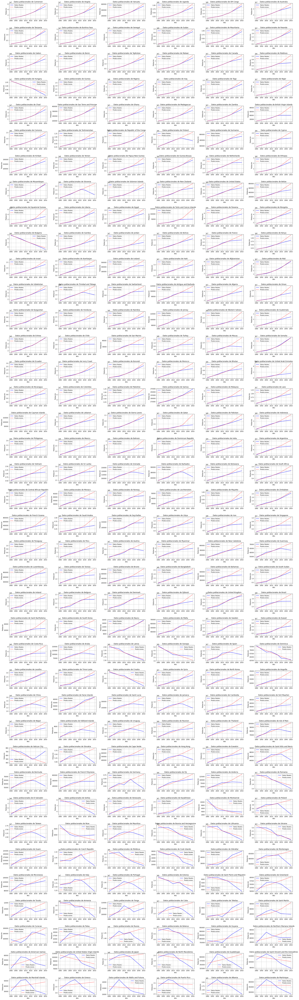

In [ ]:
fig, axs = plt.subplots(39, 6, figsize=(30, 100))
fig.set_facecolor('white')
fig.tight_layout(pad=5.0)

i = 0
j = 0

aniosConEstimaciones = anios + [2030, 2050]

for pais in regresionPorPaisEscOriginal['pais']:
    
    datosPais = datosOriginales[datosOriginales['country'] == pais]
    
    predicciones = regresionPorPaisEscOriginal[regresionPorPaisEscOriginal['pais'] == pais]

    predicciones_vals = predicciones[['regpop1980', 'regpop2000', 'regpop2010', 'regpop2023', 'regpop2024', 'est2030', 'est2050']].values.flatten()
    
    axs[i,j].plot(aniosConEstimaciones, datosPais[['pop1980','pop2000','pop2010','pop2023','pop2024','pop2030','pop2050']].values.flatten(), label='Datos Reales', color='blue')
    
    axs[i,j].plot(aniosConEstimaciones, predicciones_vals, label='Predicciones', color='red', linestyle='--')
    
    axs[i,j].set_title(f"Datos poblacionales de {pais}")
    axs[i,j].legend()
    axs[i,j].grid()
    axs[i,j].set_ylabel('Población')
    axs[i,j].set_xlabel('Año')

    j = j + 1
    if j == 6:
        j = 0
        i = i + 1


Ahora, analicemos los errores entre los valores predichos mediante regresión lineal y los del set de datos para 2050.  

In [ ]:
comparacionPaises = regresionPorPaisEscOriginal[['pais','r2','est2050']].copy().sort_index() # ordenamos por países para luego agregar las estimaciones del set de datos
comparacionPaises['pop2050'] = datosOriginales['pop2050']
comparacionPaises['errorGlobal'] = abs(comparacionPaises['pop2050'] - comparacionPaises['est2050'])
display(comparacionPaises)


,pais,r2,est2050,pop2050,errorGlobal
0,India,0.977365,2.315408e+09,1679590000,6.358184e+08
1,China,0.926608,1.804956e+09,1260290000,5.446660e+08
2,United States,0.995519,4.433531e+08,380847000,6.250614e+07
3,Indonesia,0.979056,4.229410e+08,320713000,1.022280e+08
4,Pakistan,0.979583,5.045129e+08,371864000,1.326489e+08
...,...,...,...,...,...
229,Montserrat,0.824221,2.366933e+03,3692,1.325067e+03
230,Falkland Islands,0.916473,4.568398e+03,3176,1.392398e+03
231,Tokelau,0.572953,2.847003e+03,3821,9.739968e+02
232,Niue,0.805335,1.145447e+03,1966,8.205534e+02


Observemos los dos siguientes casos: Ucrania y Países Bajos. Tomamos como ejemplo estos dos países ya que sus datos están en la misma escala en los gráficos y por lo tanto son visiblemente comparables. Podemos ver que Ucrania tiene un ajuste relativamente peor al de Países Bajos (basándonos en el valor de $R^2$), pero el error global en la predicción para la población de 2050 es menor en el caso de Ucrania que en el caso de Países Bajos. 

In [ ]:
display(comparacionPaises.query('pais == "Ukraine" | pais == "Netherlands"'))

,pais,r2,est2050,pop2050,errorGlobal
41,Ukraine,0.784958,3.284971e+07,31990100,8.596136e+05
70,Netherlands,0.997324,2.110776e+07,18958500,2.149261e+06


Queremos analizar también los errores, en general, sobre las prediccciones para 2050. Sin embargo, los países tienen poblaciones de diferentes escalas, por lo que necesitamos reescalar los errores para compararlos. Lo que haremos es obtener qué porcentaje del total de la población estimada de 2050 (del set de datos) representa el error global calculado.

,pais,r2,est2050,pop2050,errorGlobal,errorPorcentual
0,India,0.977365,2.315408e+09,1679590000,6.358184e+08,37.855572
1,China,0.926608,1.804956e+09,1260290000,5.446660e+08,43.217512
2,United States,0.995519,4.433531e+08,380847000,6.250614e+07,16.412402
3,Indonesia,0.979056,4.229410e+08,320713000,1.022280e+08,31.875239
4,Pakistan,0.979583,5.045129e+08,371864000,1.326489e+08,35.671351
...,...,...,...,...,...,...
229,Montserrat,0.824221,2.366933e+03,3692,1.325067e+03,35.890216
230,Falkland Islands,0.916473,4.568398e+03,3176,1.392398e+03,43.841254
231,Tokelau,0.572953,2.847003e+03,3821,9.739968e+02,25.490626
232,Niue,0.805335,1.145447e+03,1966,8.205534e+02,41.737200


count    234.000000
mean      33.622320
std       33.292447
min        0.004537
25%       15.462370
50%       26.442516
75%       37.482952
max      243.869805
Name: errorPorcentual, dtype: float64

Cantidad de outliers:  22


<AxesSubplot:title={'center':'Errores porcentuales de las estimaciones para 2050'}>

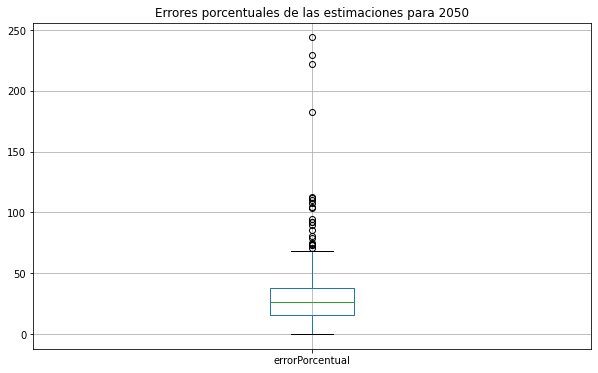

In [ ]:
comparacionPaises['errorPorcentual'] = (comparacionPaises['errorGlobal'] / comparacionPaises['pop2050']) * 100
display(comparacionPaises)

display(comparacionPaises['errorPorcentual'].describe())
q1 = comparacionPaises['errorPorcentual'].quantile(0.25)
q3 = comparacionPaises['errorPorcentual'].quantile(0.75)
outliers = comparacionPaises[comparacionPaises['errorPorcentual'] < q1 - 1.5*(q3-q1)].append( comparacionPaises[comparacionPaises['errorPorcentual'] > q3 + 1.5*(q3-q1)])

print("Cantidad de outliers: ",outliers.shape[0])

fig, ax = plt.subplots(1,1,figsize=(10,6),facecolor='white')
ax.set_title('Errores porcentuales de las estimaciones para 2050')
comparacionPaises.boxplot(column='errorPorcentual',ax=ax)

#### Conclusiones sobre las predicciones por regresión y en los datos originales

*Conclusiones en general para las proyecciones a 2050*

En base al ejemplo anterior, podemos concluir que un buen ajuste de los datos al modelo de Malthus (o bien, por regresión, a la recta de regresión) no implica que las predicciones que se puedan obtener por el método de regresión lineal sean igual de buenas o en todo caso mejores que las que se pueden obtener para datos que no sea ajustan tan bien al modelo. 

Lo anterior se debe a que las predicciones por el modelo dependen, en gran medida, del valor de la tasa de crecimiento poblacional, y por lo tanto, suponen que el comportamiento de la población se mantendrá (en crecimiento o decrecimiento exponencial). No tiene en cuenta otros parámetros que pueden llegar a influir a futuro en el dicho comportamiento exponencial. Cabe recalcar además que se cuenta con pocas muestras (5 años de un intervalo de 44 años, desde 1980 hasta 2024) para hacer predicciones casi 20 años hacia adelante (hasta 2050), lo cual influye negativamente en la precisión de las predicciones.

Por lo tanto, en aquellos países en donde los datos poblacionales se ajusten al modelo de Malthus y hacia 2050 se mantenga la tendencia de crecimiento/decrecimiento exponencial (y esto se vea reflejado en el modelo utilizado para las predicciones del dataset), las predicciones sea ajustarán a las del dataset. Si el modelo utilizado en el dataset determina que la dinámica poblacional para dichos países cambiará hacia 2050, entonces el modelo de Malthus puede no dar predicciones cercanas a las del dataset. 

En el caso de los países cuyos datos no se ajustan al modelo de Malthus, entonces no se puede concluir con certeza qué tan próximas o no serán las proyecciones mediante dicho modelo a las del dataset.

Del análisis anterior de los errores, se debe notar que el hecho de que haya pocos outliers no quiere decir que el resto de los errores porcentuales sean "aceptables" o "buenos" de por sí. La distrbución nos indica que los errores se concentran hacia valores 15% y 37%, y que relativamente son pocos los de mayor magnitud. Si consideramos que un error porcentual de aproximadamente el 20% es aceptable, entonces podemos decir que las predicciones que obtenemos son, en general, aceptables, con algunas pocas excepciones. Ahora, si se busca un error porcentual menor, entonces las predicciones no serían buenas. Es importante tener en cuenta que varias poblaciones siguen un crecimiento exponencial y se está buscando predecir 26 años hacia adelante, lo cual es un período relativamente grande para los datos poblacionales que tenemos (nuestro set de datos solo contiene datos de 5 de los 44 años de diferencia entre 1980 y 2024).

#### **Consultar**
*Duda: sobre economías en desarrollo y economías desarrolladas*

En el caso de los países **en desarrollo** para los cuales el ajuste es bueno, se observa que en varios de ellos las predicciones también se pueden considerar buenas, porque sería esperable que el crecimiento poblacional de países en desarrollo mantenga un comportamiento exponencial (y por lo tanto, que el modelo de regresión pueda dar buenas predicciones) acompañando al crecimiento de la economía. Sin embargo, esto no es una regla general.

Por otro lado, hay casos de países desarrollados como Francia y Finlandia en donde el ajuste es bueno pero las predicciones no tanto, ya que es más probable que en países desarrollados el crecimiento poblacional se desacelere o cambie de comportamiento (a uno no exponencial).

--- 
de notas anteriores
¿Qué se puede tener en cuenta?
- Comparación con el ajuste de la población al modelo de Malthus y la calidad de las predicciones (en los países cuya población se ajusta al modelo de malthus, las predicciones dadas por la regresión son cercanas a las predicciones del set de datos?)
- Analizar numéricamente las diferencias entre las predicciones por regresión y las del set de datos
- Observaciones sobre comportamientos por region/país (que se puede respaldar, opcionalmente, por clustering)

---

---

---

## Notas de pruebas anteriores

#### Modelo de Malthus (linealización)

$$P(t) = P_0 e^{rt} $$
$$ln(P) = ln(P_0 e^{rt}) $$
$$ln(P) = ln(P_0)+ln(e^{rt}) $$
$$ln(P) = ln(P_0)+rt $$

In [ ]:
import numpy as np

def valoresModeloMalthus(poblacion_inicial, tasa_crecimiento, tiempo):
    return poblacion_inicial * np.exp(tasa_crecimiento * tiempo)

# Gráfica de datos de distintos países
columnasTiempo = [0,20,30,43,44] # tomamos 1980 como t = 0, desde allí el resto son cantidad de años desde 1980 al año correspondiente.

datosConTiempo = datosPoblacionales[['pop1980','pop2000','pop2010','pop2023','pop2024']]

renombrarColumnas = dict(zip(datosConTiempo.columns,columnasTiempo))
datosConTiempo.rename(columns=renombrarColumnas,inplace=True)

datosConTiempo['pais'] = datosPoblacionales['country']
datosConTiempo['tasaCrecimiento'] = datosPoblacionales['growthRate']
datosConTiempo['tasaCrecimientoComparacion'] = np.log(datosPoblacionales['pop2050']/datosPoblacionales['pop1980'])/100 # para comparar con la tasa de crecimiento del data set
display(datosConTiempo)


KeyError: "None of [Index(['pop1980', 'pop2000', 'pop2010', 'pop2023', 'pop2024'], dtype='object')] are in the [columns]"

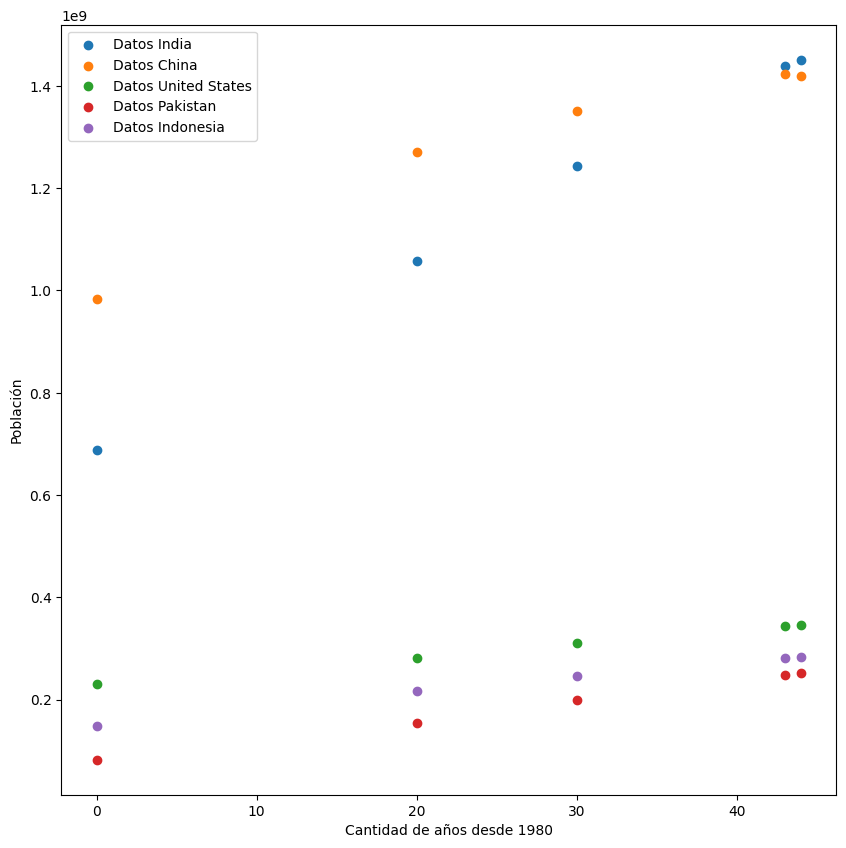

In [ ]:
paises = ['India','China','United States','Pakistan','Indonesia']

plt.figure(figsize=(10,10),facecolor='w')

for pais in paises: 
    datosPais = datosConTiempo[datosConTiempo['pais'] == pais]
    tasaCrecimientoPais = datosPais['tasaCrecimiento'].values[0]
    datosPais = datosPais.drop(columns=['pais','tasaCrecimiento','tasaCrecimientoComparacion'])

    plt.scatter(datosPais.columns,datosPais.values[0],label='Datos '+pais)
    plt.xlabel('Cantidad de años desde 1980')
    plt.ylabel('Población')
    plt.legend()

ValueError: could not convert string to float: 'tasaCrecimientoComparacion'

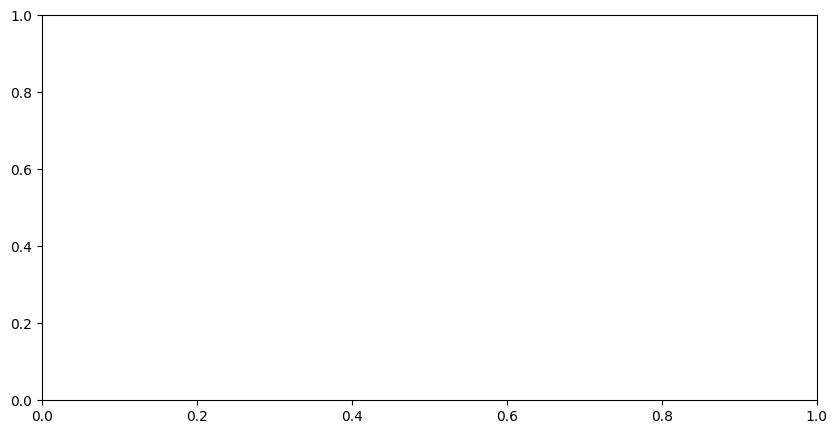

In [ ]:
import matplotlib.pyplot as plt

paises = datosConTiempo['pais'].values

for pais in paises: 
    datosPais = datosConTiempo[datosConTiempo['pais'] == pais]
    tasaCrecimientoPais = datosPais['tasaCrecimiento'].values[0]
    datosPais = datosPais.drop(columns='pais')
    datosPais = datosPais.drop(columns='tasaCrecimiento')

    plt.figure(figsize=(10,5),facecolor='w')
    plt.scatter(datosPais.columns,datosPais.values[0],label='Datos '+pais)
    plt.plot(datosPais.columns, valoresModeloMalthus(datosPais.values[0][0],tasaCrecimientoPais,datosPais.columns),label='Modelo Malthus')
    plt.title('Población de '+pais )
    plt.xlabel('Cantidad de años desde 1980')
    plt.ylabel('Población')
    plt.legend()





---

#### Reunión 10/11 

##### Pruebas con scipy.integrate

,country,pop1980,pop2000,pop2010,pop2023,pop2024,pop2030,pop2050,landAreaKm,netChange,growthRate,worldPercentage,density
17,Turkey,45408800,65426000,73346800,87270500,87473800,89027500,91258100,783562.0,0.0065,0.0023,0.0109,111.6361
21,Tanzania,19189800,34260100,44758500,66617600,68560200,80913100,129621000,885800.0,0.0622,0.0292,0.0086,77.3992
27,Colombia,26104500,39089900,44777300,52321200,52886400,55736500,59385400,1109500.0,0.0175,0.0108,0.0066,47.6669
84,Dominican Republic,5729040,8584190,9820180,11331300,11427600,11938900,12996300,48310.0,0.0030,0.0085,0.0014,236.5473
106,Kyrgyzstan,3729370,5025140,5491760,7073520,7186010,7803620,9642950,191800.0,0.0035,0.0159,0.0009,37.4662
127,Kuwait,1504780,1954710,2943370,4838780,4934510,5324200,6367760,17820.0,0.0032,0.0198,0.0006,276.9085
155,Estonia,1476460,1397000,1331450,1367200,1360550,1302770,1174270,42750.0,-0.0004,-0.0049,0.0002,31.8257
195,Aruba,62039,88761,100114,107939,108066,107864,100002,180.0,0.0000,0.0012,0.0000,600.3667
198,Saint Vincent and the Grenadines,104213,113545,109959,101323,100616,96856,88942,390.0,0.0000,-0.0070,0.0000,257.9897
207,Greenland,50111,56209,56614,55922,55840,55050,49898,410450.0,0.0000,-0.0015,0.0000,0.1360


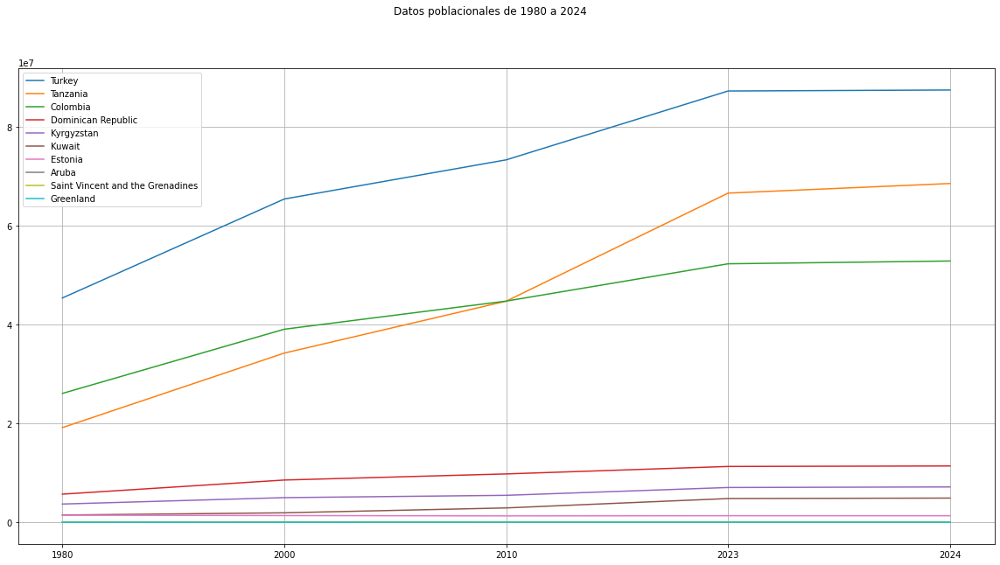

In [ ]:
from random import randrange
import matplotlib.pyplot as plt
import numpy as np

# Para seleccionar países al azar, comentar la linea indices = [i for i in range(10)]
indices = []
for i in range(10):
    indiceAleatorio = randrange(datosPoblacionales.index.size)
    while indiceAleatorio in indices:
        indiceAleatorio = randrange(datosPoblacionales.index.size)
    indices.append(randrange(234))

#indices = [i for i in range(10)]

datosPoblacionales10Paises = datosPoblacionales[datosPoblacionales.index.isin(indices)]
display(datosPoblacionales10Paises)

anios = ['1980','2000','2010','2023','2024']

plt.figure(figsize=(20, 10),facecolor='w')
plt.suptitle('Datos poblacionales de 1980 a 2024')
plt.grid()

for pais in datosPoblacionales10Paises['country']:
    datosPais = datosPoblacionales10Paises[datosPoblacionales10Paises['country'] == pais]
    plt.plot(anios, datosPais[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label=pais)
    plt.legend()
    

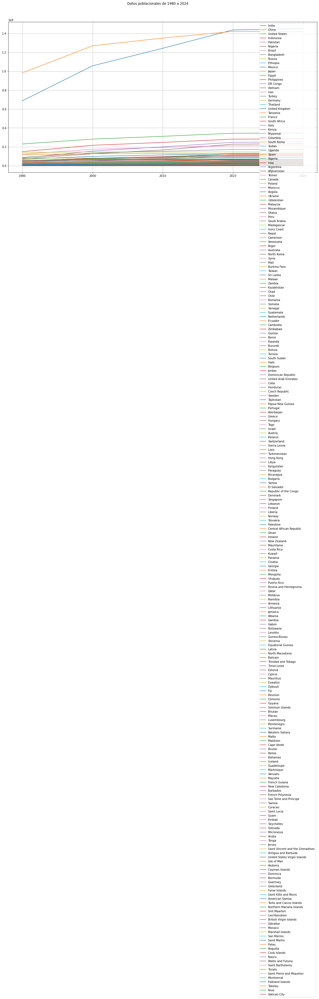

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

anios = ['1980','2000','2010','2023','2024']

plt.figure(figsize=(20, 10),facecolor='w')
plt.suptitle('Datos poblacionales de 1980 a 2024')
plt.grid()

for pais in datosPoblacionales['country']:
    datosPais = datosPoblacionales[datosPoblacionales['country'] == pais]
    plt.plot(anios, datosPais[['pop1980','pop2000','pop2010','pop2023','pop2024']].values.flatten(), label=pais)
    plt.legend()

plt.subplot(39,6)